In [2]:
#Initialization

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
from datetime import datetime
import os
#os.getcwd()

import lightning.pytorch as pl
from lightning.pytorch.callbacks import EarlyStopping, LearningRateMonitor
from lightning.pytorch.loggers import TensorBoardLogger
import torch
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
os.environ['CUDA_VISIBLE_DEVICES'] ='0'

from pytorch_forecasting import Baseline, TemporalFusionTransformer, TimeSeriesDataSet
from pytorch_forecasting.data import GroupNormalizer
from pytorch_forecasting.metrics import SMAPE, PoissonLoss, QuantileLoss
from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters
from pytorch_forecasting.data.encoders import NaNLabelEncoder

import tensorflow as tf 
import tensorboard as tb 
tf.io.gfile = tb.compat.tensorflow_stub.io.gfile

In [67]:
file_path = 'C:/Users/Weihau.yap/.spyder-py3/TFT/Walmart/features.csv'
file_path1 = 'C:/Users/Weihau.yap/.spyder-py3/TFT/Walmart/stores.csv'
file_path2 = 'C:/Users/Weihau.yap/.spyder-py3/TFT/Walmart/test.csv'
file_path3 = 'C:/Users/Weihau.yap/.spyder-py3/TFT/Walmart/train.csv'

features = pd.read_csv(file_path)
stores = pd.read_csv(file_path1)
test = pd.read_csv(file_path2)
train = pd.read_csv(file_path3)

train['Date'] = pd.to_datetime(train['Date'])
test['Date'] = pd.to_datetime(test['Date'])

### Multi-horizon Time Series Sales Forecasting With Deep Learning Based Transformer Model

In [68]:
features.head(5)

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


In [5]:
stores.head(5)

,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875


In [6]:
train.head(5)

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-02-05,24924.50,False
1,1,1,2010-02-12,46039.49,True
2,1,1,2010-02-19,41595.55,False
3,1,1,2010-02-26,19403.54,False
4,1,1,2010-03-05,21827.90,False


In [7]:
test.head(5)

,Store,Dept,Date,IsHoliday
0,1,1,2012-11-02,False
1,1,1,2012-11-09,False
2,1,1,2012-11-16,False
3,1,1,2012-11-23,True
4,1,1,2012-11-30,False


In [8]:
# Number of Nans, num_sold not present in test, it's the column we have to predict

(train.isna().sum(axis = 0).rename('nans_per_column_train').rename_axis('column').reset_index().set_index('column')
 .join(test.isna().sum(axis = 0).rename('nans_per_column_test').rename_axis('column').reset_index().set_index('column')))

,nans_per_column_train,nans_per_column_test
column,,
Store,0,0.0
Dept,0,0.0
Date,0,0.0
Weekly_Sales,0,NaN
IsHoliday,0,0.0


In [9]:
# Number of Unique values, num_sold not present in test, it's the column we have to predict

(train.nunique(axis = 0).rename('n_unique_per_column_train').rename_axis('column').reset_index().set_index('column')
 .join(test.nunique(axis = 0).rename('n_unique_per_column_test').rename_axis('column').reset_index().set_index('column')))

,n_unique_per_column_train,n_unique_per_column_test
column,,
Store,45,45.0
Dept,81,81.0
Date,143,39.0
Weekly_Sales,359464,NaN
IsHoliday,2,2.0


In [13]:
#Concat the store type and size
data = pd.concat([train, test], axis = 0, ignore_index=True)
data['Date'] = pd.to_datetime(data['Date'])
data.head(5)

#Merge the store type and size
df = features.merge(stores, how = 'inner', on = 'Store')
df['Date'] = pd.to_datetime(df['Date'])
df['Day'] = df.Date.dt.day
df['Week'] = df.Date.dt.week
df['Month'] = df.Date.dt.month
df['Year'] = df.Date.dt.year
df.head(5)

data_merge = data.merge(df, how = 'inner', on = ['Store', 'Date', 'IsHoliday'])
data_merge.head(5)

#Data Slicing for later
train_merge = data_merge.iloc[:len(train)]
test_merge = data_merge.iloc[len(train):]

C:\Users\Weihau.yap\AppData\Local\Temp\ipykernel_18580\2928245225.py:10: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  df['Week'] = df.Date.dt.week


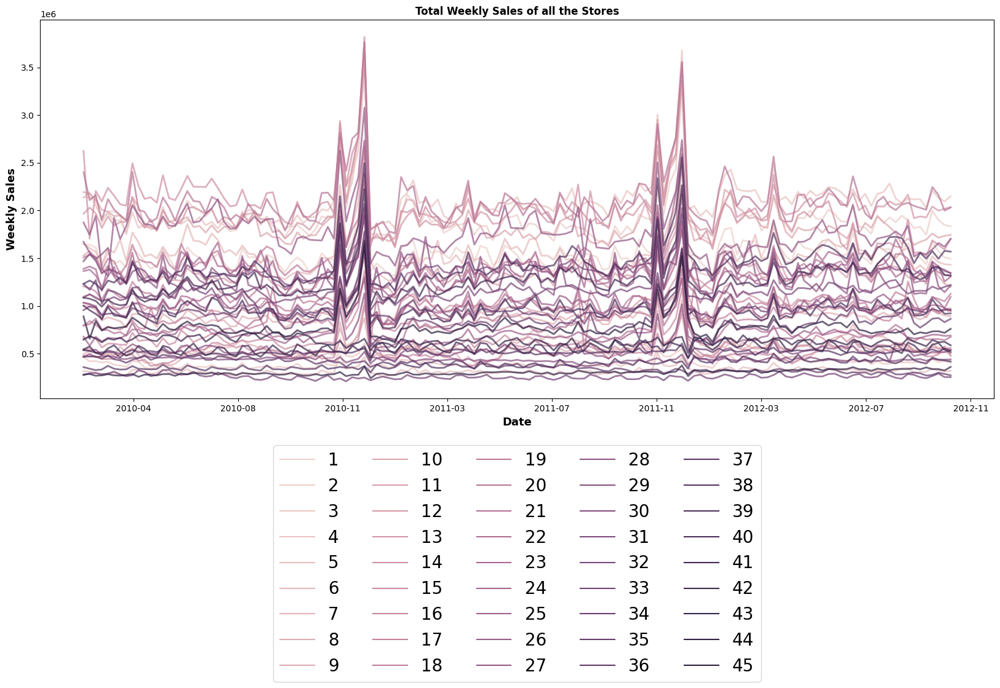

In [17]:
#Showing the trend of weekly sales for each store
fig, ax = plt.subplots(1, 1, figsize = (20, 8))
sns.lineplot(x='Date',y='Weekly_Sales',hue='Store',legend='full',data=(train.groupby(['Date', 'Store']).Weekly_Sales.sum().rename('Weekly_Sales')
                                                       .reset_index().sort_values('Date', ascending = True, ignore_index=True)), linewidth = 2, alpha = 0.7)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=120)) 
ax.set_xlabel('Date', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('Weekly Sales', color='black', fontweight='bold', fontsize=13)
#ax.legend(fontsize = 20, loc = 'upper left')
plt.legend(bbox_to_anchor=(0.5, -0.1), loc="upper center", ncol=len(train.columns),fontsize = 20)
ax.set_title('Total Weekly Sales of all the Stores', fontweight = 'bold', fontsize = 12);

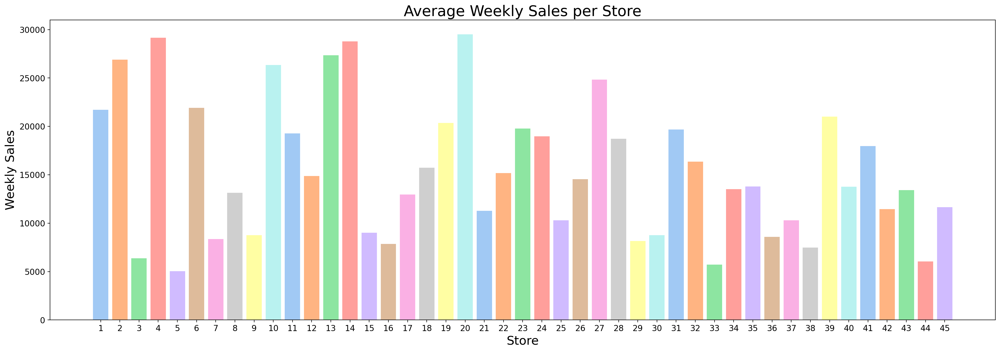

In [21]:
#Showing the average weekly sales of each store
weekly_sales_dept = train_merge['Weekly_Sales'].groupby(train_merge['Store']).mean()
x = weekly_sales_dept.index
y = weekly_sales_dept.values

plt.figure(figsize=(25, 8), dpi=200)
plt.bar(x,y,color=sns.color_palette("pastel",45))
plt.xticks(range(min(x), max(x)+1), fontsize=12)
plt.title('Average Weekly Sales per Store', fontsize=22)
plt.xlabel('Store', fontsize=18)
plt.ylabel('Weekly Sales', fontsize=18)
plt.yticks(fontsize=12)
plt.show()

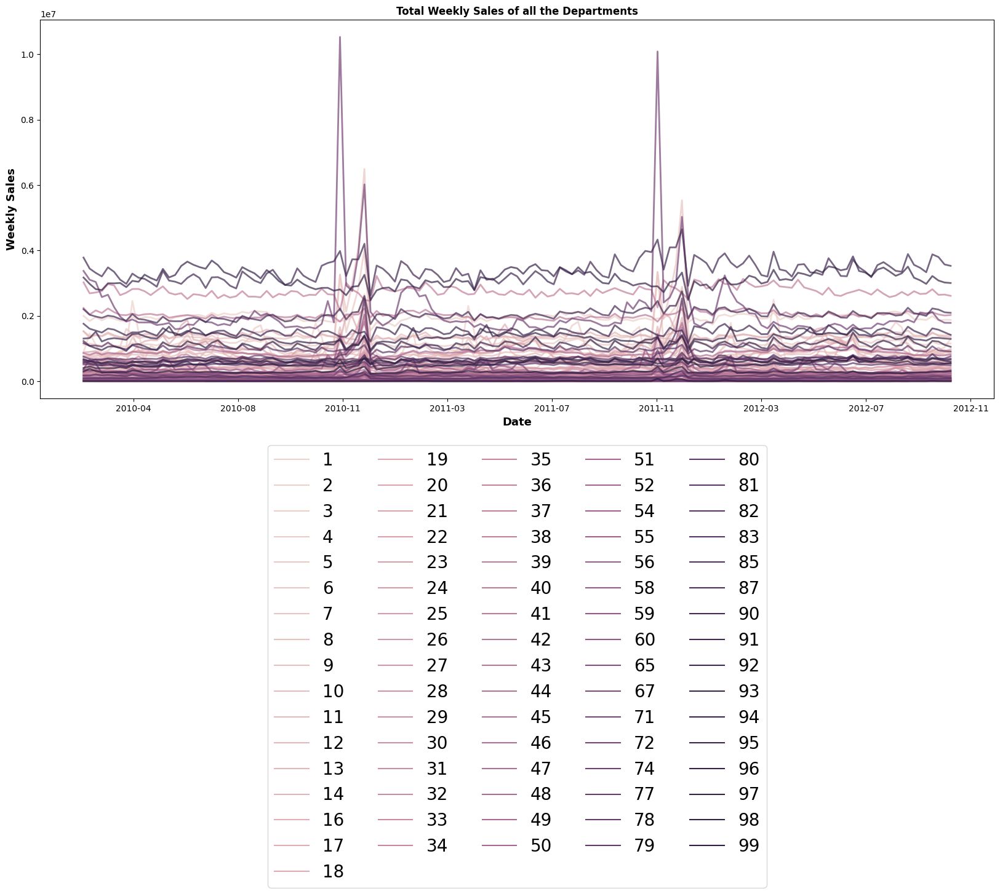

In [22]:
#Showing the trend of weekly sales for each department
fig, ax = plt.subplots(1, 1, figsize = (20, 8))
sns.lineplot(x='Date',y='Weekly_Sales',hue='Dept',legend='full',data=(train.groupby(['Date', 'Dept']).Weekly_Sales.sum().rename('Weekly_Sales')
                                                       .reset_index().sort_values('Date', ascending = True, ignore_index=True)), linewidth = 2, alpha = 0.7)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=120)) 
ax.set_xlabel('Date', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('Weekly Sales', color='black', fontweight='bold', fontsize=13)
#ax.legend(fontsize = 20, loc = 'upper left')
plt.legend(bbox_to_anchor=(0.5, -0.1), loc="upper center", ncol=len(train.columns),fontsize = 20)
ax.set_title('Total Weekly Sales of all the Departments', fontweight = 'bold', fontsize = 12);

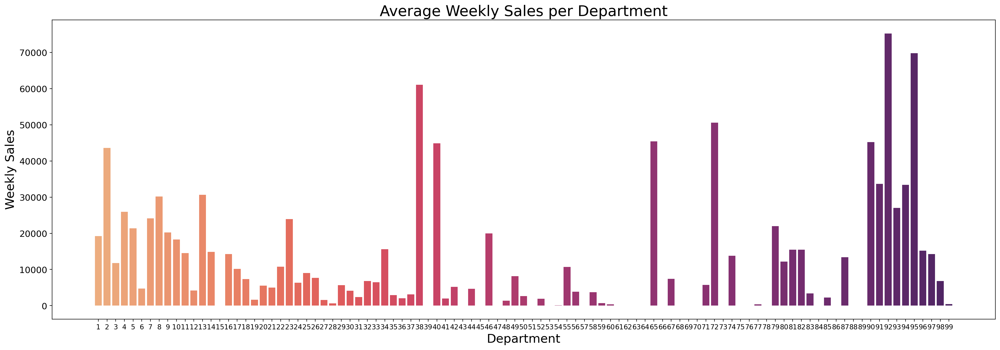

In [23]:
#Showing the average weekly sales of each department
weekly_sales_dept = train_merge['Weekly_Sales'].groupby(train_merge['Dept']).mean()
x = weekly_sales_dept.index
y = weekly_sales_dept.values

plt.figure(figsize=(25, 8), dpi=200)
plt.bar(x,y,color=sns.color_palette("flare",81))
plt.xticks(range(min(x), max(x)+1))
plt.title('Average Weekly Sales per Department', fontsize=22)
plt.xlabel('Department', fontsize=18)
plt.ylabel('Weekly Sales', fontsize=18)
plt.yticks(fontsize=13)
plt.show()

In [24]:
print(train.shape)
print(test.shape)
print(data.shape)
print(features.shape)
print(stores.shape)
print(df.shape)

(421570, 5)
(115064, 4)
(536634, 5)
(8190, 12)
(45, 3)
(8190, 18)


In [25]:
#Want to know the unique value of department in each store
print(data['Store'].unique())
print(data['Dept'].unique())

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 16 17 18 19 20 21 22 23 24 25
 26 27 28 29 30 31 32 33 34 35 36 37 38 40 41 42 44 45 46 47 48 49 51 52
 54 55 56 58 59 60 67 71 72 74 77 78 79 80 81 82 83 85 87 90 91 92 93 94
 95 96 97 98 99 39 50 43 65]


In [27]:
#Data integrity
store_dept_table = pd.pivot_table(data_merge, index='Store', columns='Dept',
                                  values='Weekly_Sales')
display(store_dept_table)

Dept,1,2,3,4,5,6,7,8,9,10,...,90,91,92,93,94,95,96,97,98,99
Store,,,,,,,,,,,,,,,,,,,,,
1,22513.322937,46102.090420,13150.478042,36964.154476,24257.941119,4801.780140,24566.487413,35718.257622,28062.052238,31033.386364,...,82427.547832,64238.943427,135458.969510,71699.182378,63180.568182,120772.062168,33251.831639,35207.348811,11827.770769,306.091081
2,30777.980769,65912.922517,17476.563357,45607.666573,30555.315315,6808.382517,40477.837063,58707.369441,34375.864476,38845.854476,...,97611.537133,80610.380350,164840.230979,70581.977063,70018.672517,143588.751888,34319.063846,40697.204056,14035.400839,475.896905
3,7328.621049,16841.775664,5509.300769,8434.186503,11695.366573,2012.411818,10044.341608,8310.254196,9062.007692,10871.944126,...,1540.049161,318.685594,7568.280210,NaN,656.294444,15745.528252,3934.540000,343.437357,30.570833,NaN
4,36979.940070,93639.315385,19012.491678,56603.400140,45668.406783,8241.777692,50728.151399,62949.723776,34437.170979,37269.667413,...,89248.965524,66535.407203,159365.107902,67815.163007,68159.106573,147236.473706,38346.573077,39339.238951,15009.249371,623.182381
5,9774.553077,12317.953287,4101.085175,9860.806783,6699.202238,1191.057622,6124.484336,13735.709441,7919.805944,9783.395385,...,3059.520000,1457.221678,7759.205594,NaN,411.431486,19340.693986,5985.671119,667.070315,29.976087,NaN
6,23867.553776,50269.437273,16806.638811,34187.366503,34465.307622,7225.566643,34526.870420,47577.719790,48271.060140,47436.477902,...,53715.366084,45270.405175,99024.796503,41359.651189,41701.693497,89208.786294,30450.542238,20637.667063,9728.100629,388.636750
7,9542.801259,22603.690769,8633.536923,14950.518601,13860.350490,6329.928811,10925.757063,13970.619371,29722.736084,21136.560280,...,13858.405874,10263.880000,26530.890559,1328.178252,699.332522,34208.097273,1123.383217,4374.927902,260.886596,15.000000
8,14789.827343,35729.821748,10683.305105,21089.309301,19838.849231,3395.425455,20268.743776,26438.524336,11792.661678,20666.433776,...,39333.566154,31530.560909,60465.630000,27515.635315,25442.578042,62951.463706,16.986667,16978.366503,6880.466434,298.153714
9,11846.558252,24969.477413,7497.356783,17165.947762,19282.746014,2806.416364,13826.694336,21424.470699,13196.569720,12810.480350,...,2981.249510,869.273287,14123.063147,21.240000,599.112568,29575.050769,3596.107762,372.655556,27.930000,NaN


In [28]:
#Check whether the four largest holiday --> Super Bowl, Labour Day, Thanksgiving, and Christmas are included
holiday = train_merge[train_merge['IsHoliday'] == True]['Date']
print("Super Bowl: 12-Feb-10, 11-Feb-11, 10-Feb-12, 8-Feb-13")
print("Labor Day: 10-Sep-10, 9-Sep-11, 7-Sep-12, 6-Sep-13")
print("Thanksgiving: 26-Nov-10, 25-Nov-11, 23-Nov-12, 29-Nov-13")
print("Christmas: 31-Dec-10, 30-Dec-11, 28-Dec-12, 27-Dec-13 \n")
print("Holiday available in the dataset: \n", holiday.unique())
print("\nHoliday after 7-Sep-12 are missing(23-Nov-12, 28-Dec-12, 8-Feb-13, 6-Sep-13, 29-Nov-13, 27-Dec-13)")

Super Bowl: 12-Feb-10, 11-Feb-11, 10-Feb-12, 8-Feb-13
Labor Day: 10-Sep-10, 9-Sep-11, 7-Sep-12, 6-Sep-13
Thanksgiving: 26-Nov-10, 25-Nov-11, 23-Nov-12, 29-Nov-13
Christmas: 31-Dec-10, 30-Dec-11, 28-Dec-12, 27-Dec-13 

Holiday available in the dataset: 
 ['2010-02-12T00:00:00.000000000' '2010-09-10T00:00:00.000000000'
 '2010-11-26T00:00:00.000000000' '2010-12-31T00:00:00.000000000'
 '2011-02-11T00:00:00.000000000' '2011-09-09T00:00:00.000000000'
 '2011-11-25T00:00:00.000000000' '2011-12-30T00:00:00.000000000'
 '2012-02-10T00:00:00.000000000' '2012-09-07T00:00:00.000000000']

Holiday after 7-Sep-12 are missing(23-Nov-12, 28-Dec-12, 8-Feb-13, 6-Sep-13, 29-Nov-13, 27-Dec-13)


In [29]:
#Caluclate sales during holiday
holiday_sales = train_merge[train_merge['Date'].isin(holiday)]
holiday_sales = holiday_sales.groupby('Date')['Weekly_Sales'].agg(Total_Weekly_Sales='mean').reset_index()
holiday_sales

,Date,Total_Weekly_Sales
0,2010-02-12,16352.056032
1,2010-09-10,15537.758883
2,2010-11-26,22403.336705
3,2010-12-31,13738.538566
4,2011-02-11,16111.706191
5,2011-09-09,15809.069483
6,2011-11-25,22043.563476
7,2011-12-30,15332.154858
8,2012-02-10,16664.247891
9,2012-09-07,16294.692957


In [30]:
#Convert holiday dates into week form for plotting
holiday_sales = train_merge[train_merge['Date'].isin(holiday)]
holiday_sales = holiday_sales.groupby('Week')['Weekly_Sales'].agg(Total_Weekly_Sales='mean').reset_index()
holiday_sales

,Week,Total_Weekly_Sales
0,6,16377.996441
1,36,15881.693339
2,47,22220.944538
3,52,14543.387158


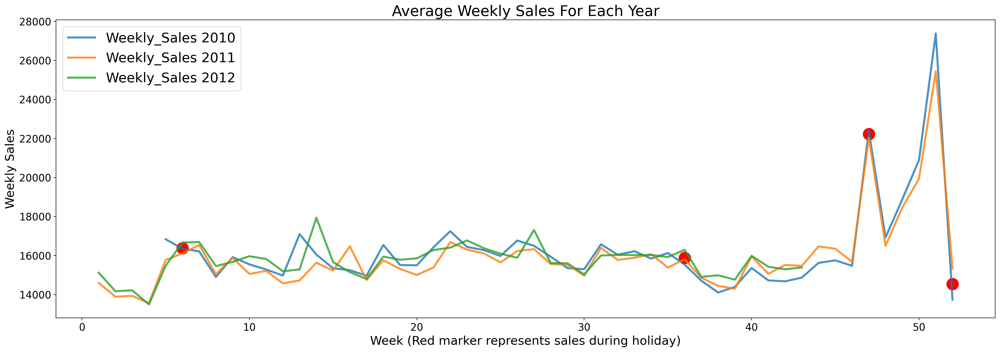

In [31]:
# Average Weekly Sales for the all 3 years
weekly_sales_2010 = train_merge[train_merge['Year']==2010]['Weekly_Sales'].groupby(train_merge['Week']).mean()
weekly_sales_2011 = train_merge[train_merge['Year']==2011]['Weekly_Sales'].groupby(train_merge['Week']).mean()
weekly_sales_2012 = train_merge[train_merge['Year']==2012]['Weekly_Sales'].groupby(train_merge['Week']).mean()

#sns.lineplot(weekly_sales_2010.index, weekly_sales_2010.values) # for plotting then lineplot
x = weekly_sales_2010.index
y = weekly_sales_2010.values
x1 = weekly_sales_2011.index
y1 = weekly_sales_2011.values
x2 = weekly_sales_2012.index
y2 = weekly_sales_2012.values

plt.figure(figsize=(25, 8), dpi=200)
plt.plot(x,y,alpha=0.8,linewidth=3,label='Weekly_Sales 2010')
plt.plot(x1,y1,alpha=0.8,linewidth=3,label='Weekly_Sales 2011')
plt.plot(x2,y2,alpha=0.8,linewidth=3,label='Weekly_Sales 2012')
plt.scatter(holiday_sales['Week'],holiday_sales['Total_Weekly_Sales'],c='red',s=300)

plt.title("Average Weekly Sales For Each Year",fontsize=22)
plt.xlabel("Week (Red marker represents sales during holiday)",fontsize=18)
plt.xticks(fontsize=15)
plt.ylabel("Weekly Sales",fontsize=18)
plt.yticks(fontsize=15)
#plt.axhline(y=1000.0, color='r', linestyle='--', linewidth=3)
plt.legend(prop={'size': 20})
plt.show()

### Data Manipulation

In [34]:
train1 = train.groupby(['Date','Store'])['Weekly_Sales'].agg(Total_Weekly_Sales='sum').reset_index()
train1[train1['Store']==1].head(5)

,Date,Store,Total_Weekly_Sales
0,2010-02-05,1,1643690.90
45,2010-02-12,1,1641957.44
90,2010-02-19,1,1611968.17
135,2010-02-26,1,1409727.59
180,2010-03-05,1,1554806.68


In [35]:
train_merge1 = train1.merge(df, how = 'inner', on = ['Date','Store'])
train_merge1.drop(columns=['MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5'], inplace=True)
train_merge1 = train_merge1.fillna(0)
train_merge1.head(5)

,Date,Store,Total_Weekly_Sales,Temperature,Fuel_Price,CPI,Unemployment,IsHoliday,Type,Size,Day,Week,Month,Year
0,2010-02-05,1,1643690.90,42.31,2.572,211.096358,8.106,False,A,151315,5,5,2,2010
1,2010-02-05,2,2136989.46,40.19,2.572,210.752605,8.324,False,A,202307,5,5,2,2010
2,2010-02-05,3,461622.22,45.71,2.572,214.424881,7.368,False,B,37392,5,5,2,2010
3,2010-02-05,4,2135143.87,43.76,2.598,126.442065,8.623,False,A,205863,5,5,2,2010
4,2010-02-05,5,317173.10,39.70,2.572,211.653972,6.566,False,B,34875,5,5,2,2010


In [36]:
train_merge1.isna().sum(axis = 0).rename('nans_per_column_train').rename_axis('column').reset_index().set_index('column')

,nans_per_column_train
column,
Date,0
Store,0
Total_Weekly_Sales,0
Temperature,0
Fuel_Price,0
CPI,0
Unemployment,0
IsHoliday,0
Type,0


In [37]:
#Data Manipulation
train_merge1 = (train_merge1.merge((train_merge1[['Date']].drop_duplicates(ignore_index=True).rename_axis('time_idx')).reset_index(), on = ['Date']))
train_merge1['Store'] = train_merge1['Store'].astype('string').astype("category")
train_merge1['Type'] = train_merge1['Type'].astype('string').astype("category")
train_merge1['Size'] = train_merge1['Size'].astype('string').astype("category")
#train_merge1['Date'] = train_merge1['Date'].astype('string').astype("category")
train_merge1['IsHoliday'] = train_merge1['IsHoliday'].astype('string').astype("category")
train_merge1['Day'] = train_merge1['Day'].astype('string').astype("category")
train_merge1['Week'] = train_merge1['Week'].astype('int')
train_merge1['Month'] = train_merge1['Month'].astype('string').astype("category")
train_merge1['Year'] = train_merge1['Year'].astype('string').astype("category")
train_merge1['Log_Weekly_Sales'] = np.log(train_merge1['Total_Weekly_Sales'] + 1e-8)
train_merge1["Avg_Volume_By_Store"] = train_merge1.groupby(["Week", "Store"], observed=True).Total_Weekly_Sales.transform("mean")
train_merge1["Avg_Volume_By_Type"] = train_merge1.groupby(["Week", "Type"], observed=True).Total_Weekly_Sales.transform("mean")
train_merge1["Avg_Volume_By_Size"] = train_merge1.groupby(["Week", "Size"], observed=True).Total_Weekly_Sales.transform("mean")
train_merge1.sample(5)

,Date,Store,Total_Weekly_Sales,Temperature,Fuel_Price,CPI,Unemployment,IsHoliday,Type,Size,Day,Week,Month,Year,time_idx,Log_Weekly_Sales,Avg_Volume_By_Store,Avg_Volume_By_Type,Avg_Volume_By_Size
5861,2012-08-03,12,958667.23,88.16,3.760,130.737871,10.926,False,B,112238,3,31,8,2012,130,13.773299,9.716522e+05,8.246673e+05,9.716522e+05
2257,2011-01-21,8,822668.23,42.06,3.016,215.172993,6.262,False,A,155078,21,3,1,2011,50,13.620308,8.183115e+05,1.214210e+06,8.183115e+05
713,2010-05-21,39,1350673.98,76.67,2.826,209.392294,8.464,False,A,184109,21,20,5,2010,15,14.116114,1.415853e+06,1.326565e+06,1.415853e+06
2985,2011-05-13,16,410406.95,43.29,3.767,192.826069,6.339,False,B,57197,13,19,5,2011,66,12.924905,4.306776e+05,7.827912e+05,4.306776e+05
583,2010-04-30,44,272997.65,48.33,2.941,126.380567,7.972,False,C,39910,30,17,4,2010,12,12.517218,2.948613e+05,4.547499e+05,3.934621e+05


### Data Preparation

In [39]:
#After EDA, let's create dataloaders
#Take note that the granularity is in week

#Look back window of 6 weeks for 1 week ahead prediction
max_prediction_length = 1 * 7
max_encoder_length = 6 * 7
#Validate on last week
training_cutoff = train_merge1["time_idx"].max() - max_prediction_length

training = TimeSeriesDataSet(
    train_merge1[lambda x: x.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Total_Weekly_Sales",
    group_ids=["Store","Type","Size"],
    min_encoder_length=max_encoder_length, 
    max_encoder_length=max_encoder_length,
    min_prediction_length=1,
    max_prediction_length=max_prediction_length,
    static_categoricals=["Store","Type","Size"],
    time_varying_known_categoricals=["IsHoliday","Day","Month","Year"],
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=['Total_Weekly_Sales','Temperature','Fuel_Price','CPI','Unemployment','Log_Weekly_Sales',
                               'Avg_Volume_By_Store','Avg_Volume_By_Type','Avg_Volume_By_Size'],
    target_normalizer=GroupNormalizer(
        groups=["Store","Type","Size"], transformation="softplus"
    ),  # we normalize by group
    categorical_encoders = {"IsHoliday": NaNLabelEncoder(add_nan=True),
                            "Day": NaNLabelEncoder(add_nan=True),
                            "Month": NaNLabelEncoder(add_nan=True),
                            "Year": NaNLabelEncoder(add_nan=True),},
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
    allow_missing_timesteps=True,
)

validation = TimeSeriesDataSet.from_dataset(training, train_merge1, predict=True, stop_randomization=True)

# create dataloaders for  our model
batch_size = 64 
# if you have a strong GPU, feel free to increase the number of workers  
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=0)

In [40]:
training.index.head(5)

,time_first,time_last,time_diff_to_next,index_start,time,count,sequence_id,index_end,sequence_length
0,0,135,1,0,0,136,0,48,49
1,0,135,1,1,1,136,0,49,49
2,0,135,1,2,2,136,0,50,49
3,0,135,1,3,3,136,0,51,49
4,0,135,1,4,4,136,0,52,49


In [41]:
validation.index.head(5)

,time_first,time_last,time_diff_to_next,index_start,time,count,sequence_id,index_end,sequence_length
4230,0,142,1,94,94,143,0,142,49
4239,0,142,1,237,94,143,1,285,49
4240,0,142,1,380,94,143,2,428,49
4241,0,142,1,523,94,143,3,571,49
4242,0,142,1,666,94,143,4,714,49


### Build TFT model

In [45]:
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=5, verbose=True, mode="min")
lr_logger = LearningRateMonitor()  
logger = TensorBoardLogger("lightning_logs")  

trainer = pl.Trainer(
    max_epochs=45,
    accelerator='gpu', 
    devices=1,
    enable_model_summary=True,
    gradient_clip_val=0.1,
    callbacks=[lr_logger, early_stop_callback],
    logger=logger,
)


tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.01,
    hidden_size=160,
    attention_head_size=4,
    dropout=0.1,
    hidden_continuous_size=160,
    output_size=7,  # there are 7 quantiles by default: [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 0.98]
    loss=QuantileLoss(),
    log_interval=10, 
    reduce_on_plateau_patience=4,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\Weihau.yap\AppData\Local\Programs\Python\Python310\lib\site-packages\lightning\pytorch\utilities\parsing.py:197: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\Weihau.yap\AppData\Local\Programs\Python\Python310\lib\site-packages\lightning\pytorch\utilities\parsing.py:197: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
  rank_zero_warn(


In [46]:
torch.cuda.is_available()

True

In [47]:
torch.cuda.current_device()

0

In [48]:
torch.cuda.get_device_name()

'NVIDIA GeForce GTX 1650'

In [49]:
trainer.fit(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | QuantileLoss                    | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 1.6 K 
3  | prescalers                         | ModuleDict                      | 4.5 K 
4  | static_variable_selection          | VariableSelectionNetwork        | 315 K 
5  | encoder_variable_selection         | VariableSelectionNetwork        | 1.2 M 
6  | decoder_variable_selection         | VariableSelectionNetwork        | 212 K 
7  | static_context_variable_selection  | GatedResidualNetwork            | 103 K 
8  | static_context_initial_hidden_lstm | GatedResidualNetwork            | 103 K 
9  | static_context_initial_cell_lstm 

Sanity Checking: 0it [00:00, ?it/s]

C:\Users\Weihau.yap\AppData\Local\Programs\Python\Python310\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\Weihau.yap\AppData\Local\Programs\Python\Python310\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: 32134.084


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4038.836 >= min_delta = 0.0001. New best score: 28095.248


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2617.188 >= min_delta = 0.0001. New best score: 25478.061


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1669.904 >= min_delta = 0.0001. New best score: 23808.156


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 5 records. Best score: 23808.156. Signaling Trainer to stop.


In [50]:
best_model_path = trainer.checkpoint_callback.best_model_path
print(best_model_path)
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

lightning_logs\lightning_logs\version_63\checkpoints\epoch=9-step=700.ckpt


C:\Users\Weihau.yap\AppData\Local\Programs\Python\Python310\lib\site-packages\lightning\pytorch\utilities\parsing.py:197: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
C:\Users\Weihau.yap\AppData\Local\Programs\Python\Python310\lib\site-packages\lightning\pytorch\utilities\parsing.py:197: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
  rank_zero_warn(


### Evaluate on validation data and plot results

In [52]:
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions = best_tft.predict(val_dataloader)

#average p50 loss overall
#print((actuals - predictions).abs().mean().item())
#average p50 loss per time series
#print((actuals - predictions).abs().mean(axis=1))

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


('output', 'x', 'index', 'decoder_lengths', 'y')


C:\Users\Weihau.yap\AppData\Local\Programs\Python\Python310\lib\site-packages\pytorch_forecasting\models\base_model.py:1016: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


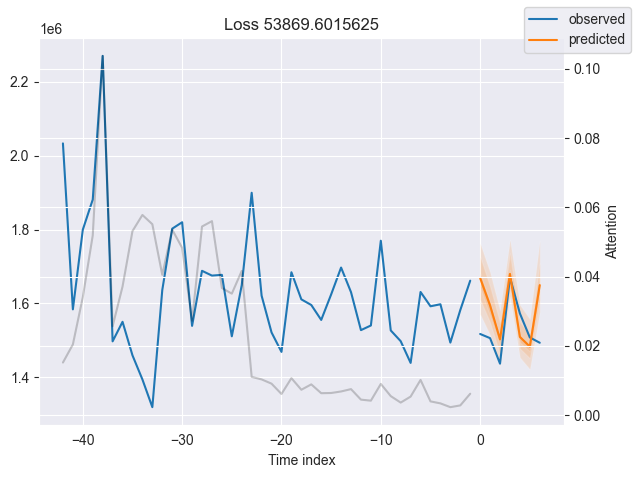

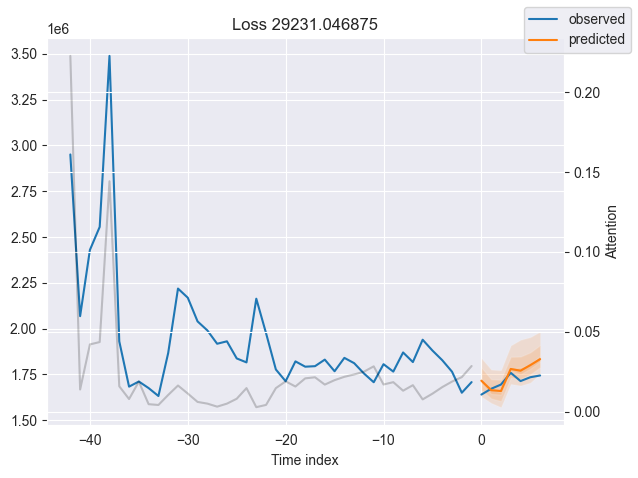

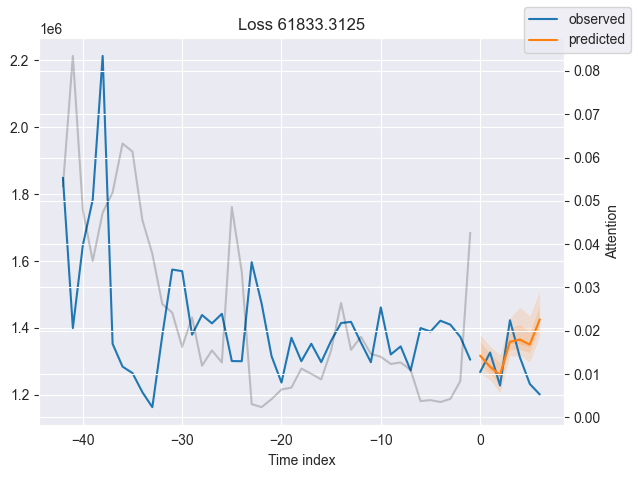

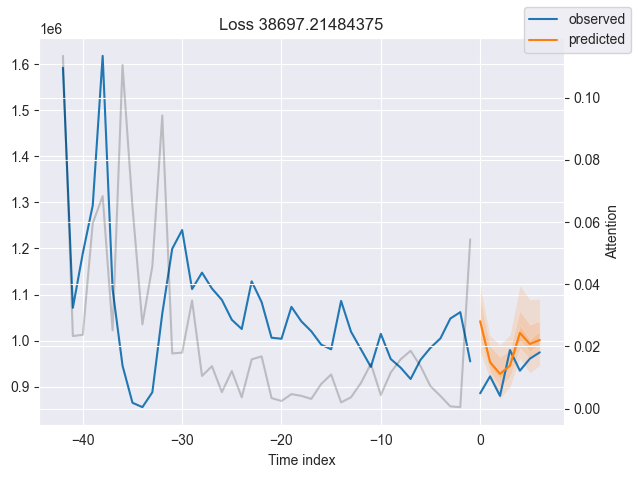

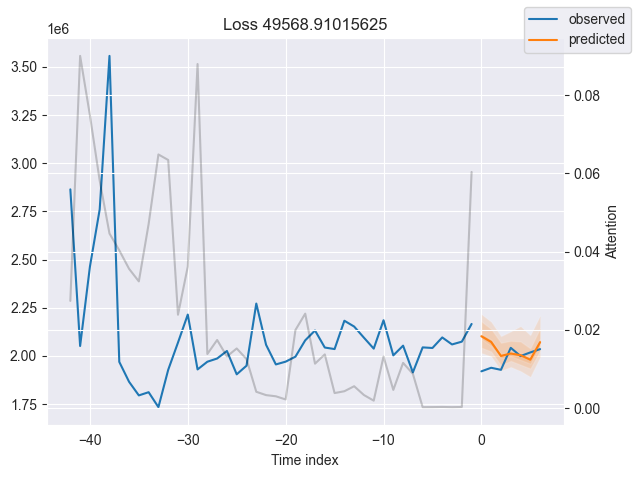

...

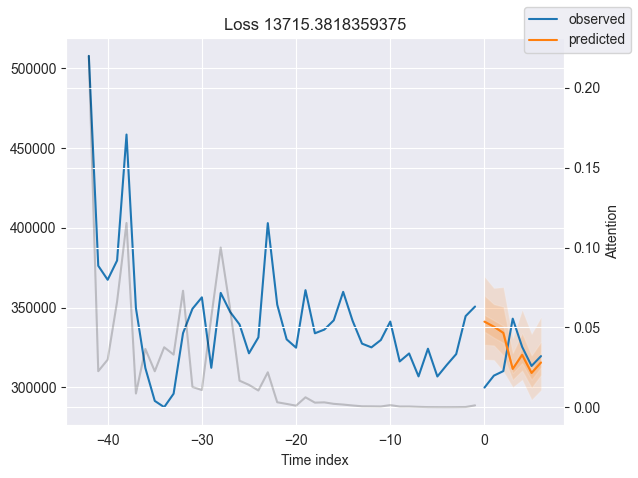

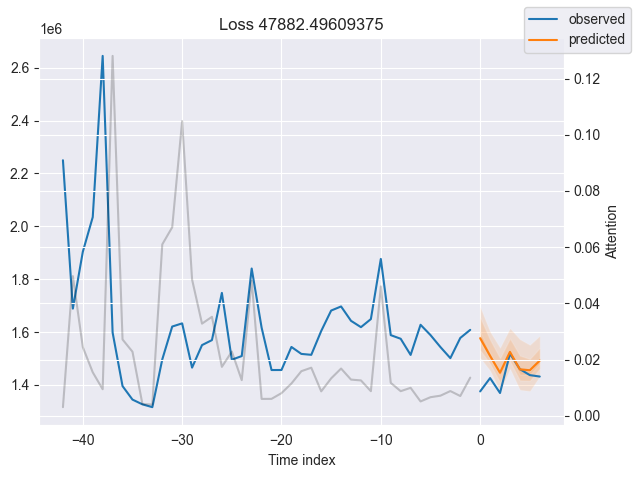

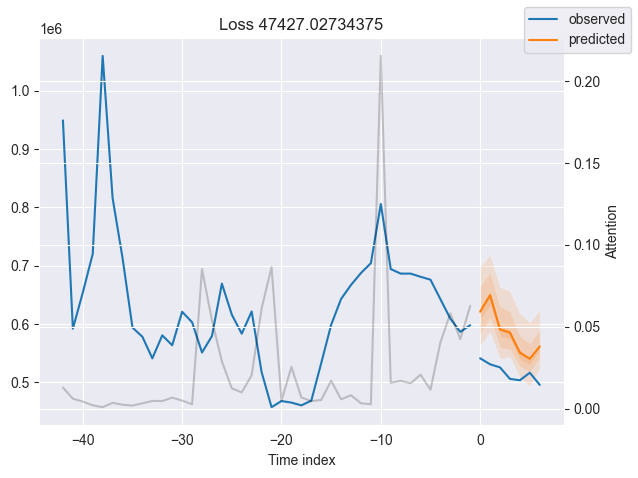

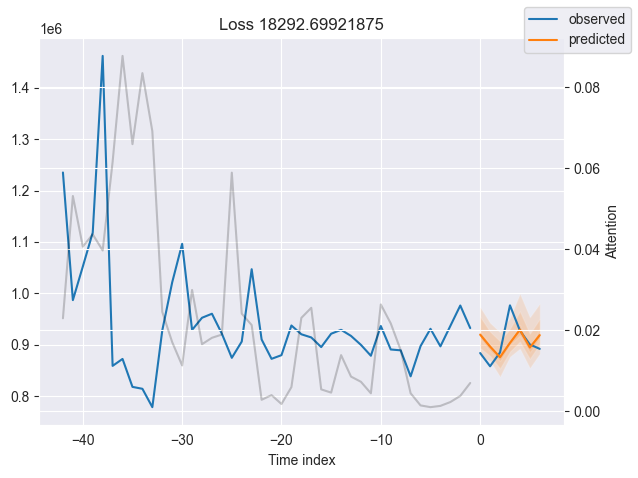

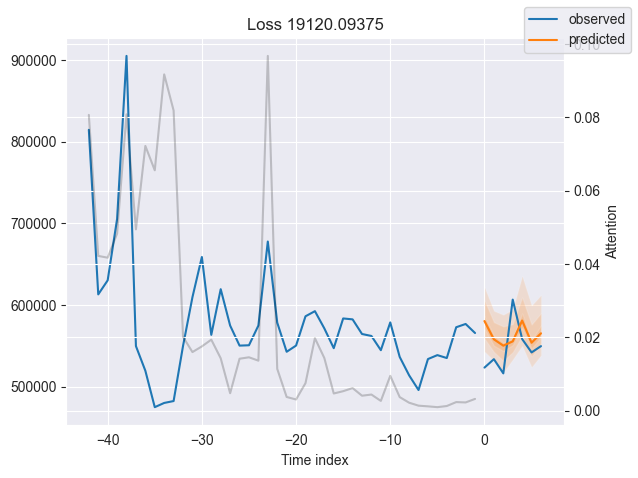

In [53]:
print(best_tft.predict(val_dataloader, mode="raw", return_x=True)._fields)

raw_predictions, x, idx, decoder_len, y = best_tft.predict(val_dataloader, mode="raw", return_x=True)

for idx in range(raw_predictions.prediction.shape[0]):
    best_tft.plot_prediction(x, raw_predictions, idx=idx, add_loss_to_title=True);

In [54]:
#Take a look at what the raw_predictions variable contains
print(raw_predictions._fields)
print('\n')
#Get 10 weeks prediction of 45 stores with 7 quantiles
print(raw_predictions['prediction'].shape)

('prediction', 'encoder_attention', 'decoder_attention', 'static_variables', 'encoder_variables', 'decoder_variables', 'decoder_lengths', 'encoder_lengths')


torch.Size([45, 7, 7])


### Evaluate on a specific Time-Series

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\Weihau.yap\AppData\Local\Programs\Python\Python310\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, predict_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


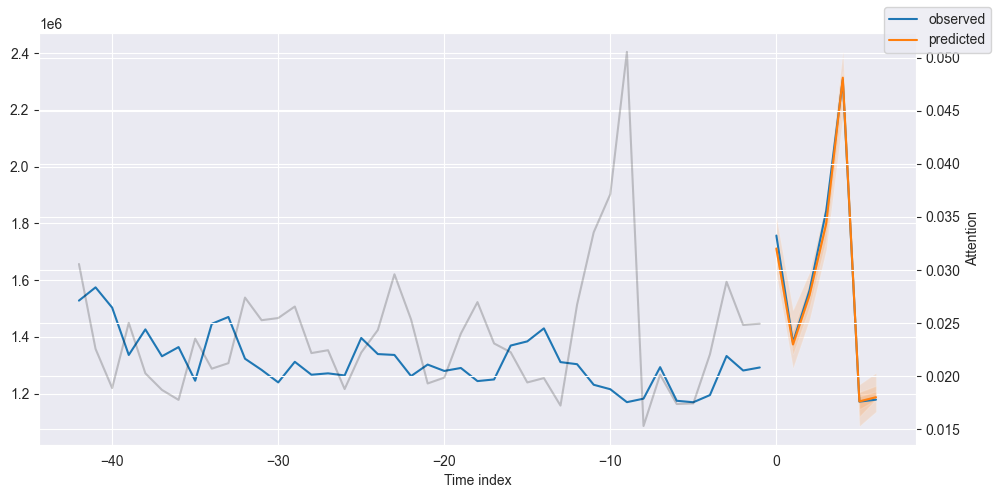

In [55]:
fig, ax = plt.subplots(figsize=(10, 5))

raw_predictions, x, index, decoder_len, y  = best_tft.predict(
    training.filter(lambda x: (x.Store == "11")),
    mode="raw",
    return_x=True,
)
best_tft.plot_prediction(x, raw_predictions, idx=0, ax=ax);

# Feature Importances

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


{'attention': <Figure size 640x480 with 1 Axes>,
 'static_variables': <Figure size 700x350 with 1 Axes>,
 'encoder_variables': <Figure size 700x575 with 1 Axes>,
 'decoder_variables': <Figure size 700x350 with 1 Axes>}

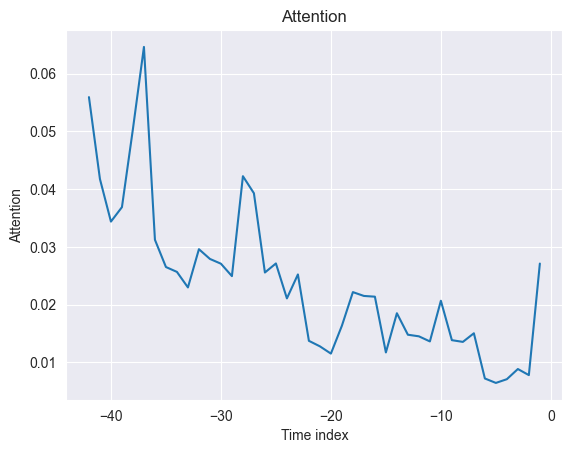

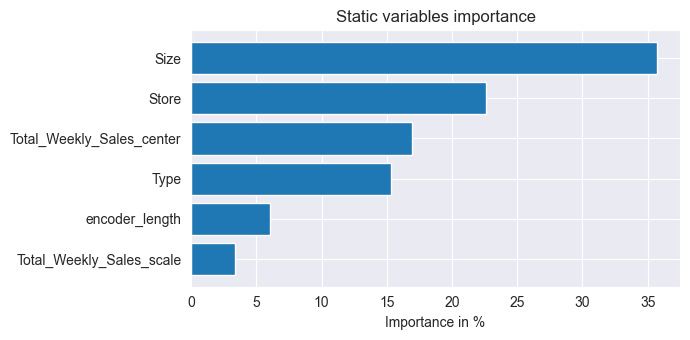

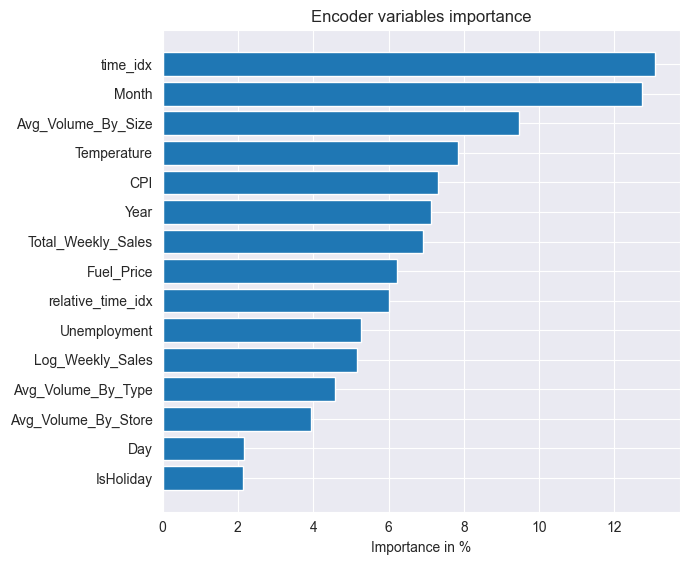

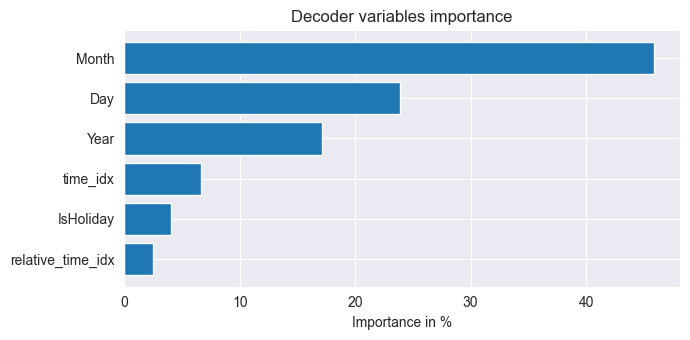

In [56]:
raw_predictions, x, index, decoder_len, y = best_tft.predict(val_dataloader, mode="raw", return_x=True)
interpretation = best_tft.interpret_output(raw_predictions, reduction="sum")
best_tft.plot_interpretation(interpretation)

### Extreme Event Detection

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\Weihau.yap\AppData\Local\Programs\Python\Python310\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:478: PossibleUserWarning: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
  rank_zero_warn(
C:\Users\Weihau.yap\AppData\Local\Programs\Python\Python310\lib\site-packages\pytorch_forecasting\models\base_model.py:1888: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  log_scale = scipy.stats.skew(values_actual) > 1.6
C:\Users\Weihau.yap\AppData\Local\Programs\Python\Python310\lib\site-packages\pytorch_forecasting\models\base_model.py:1864: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed an

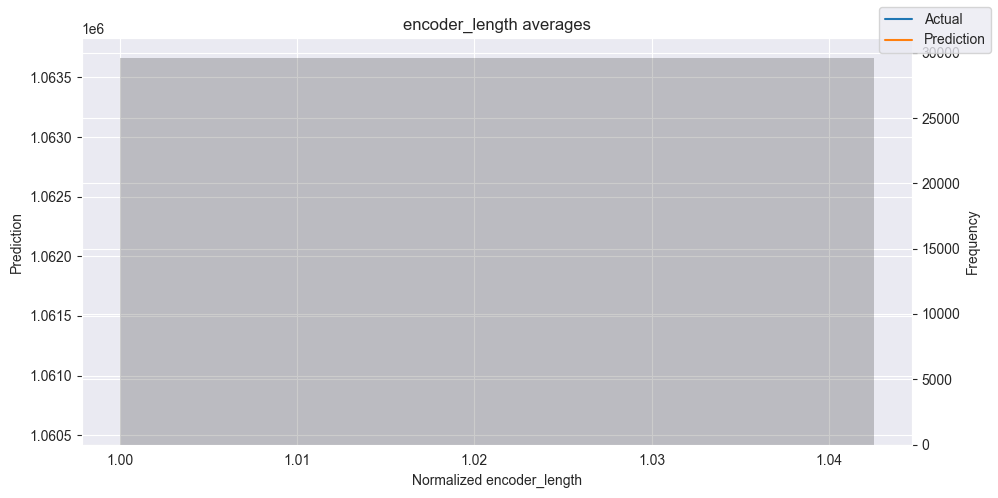

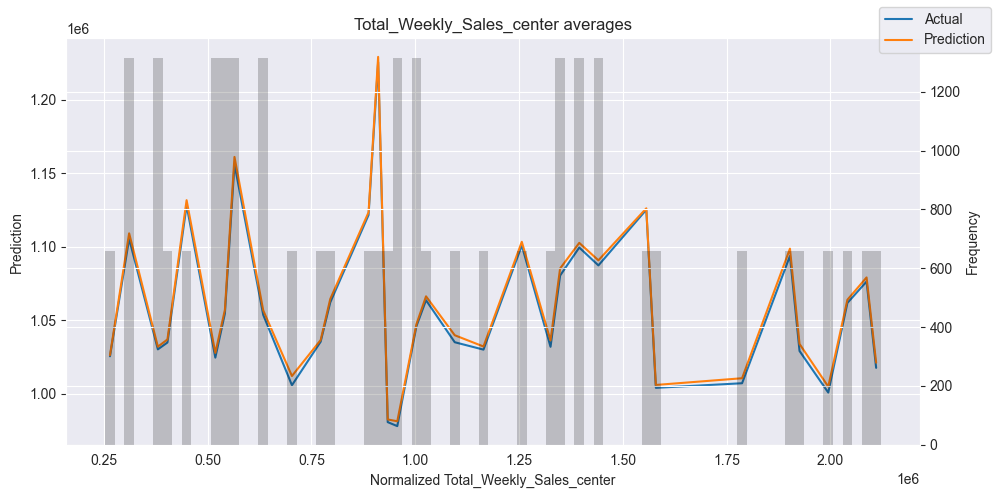

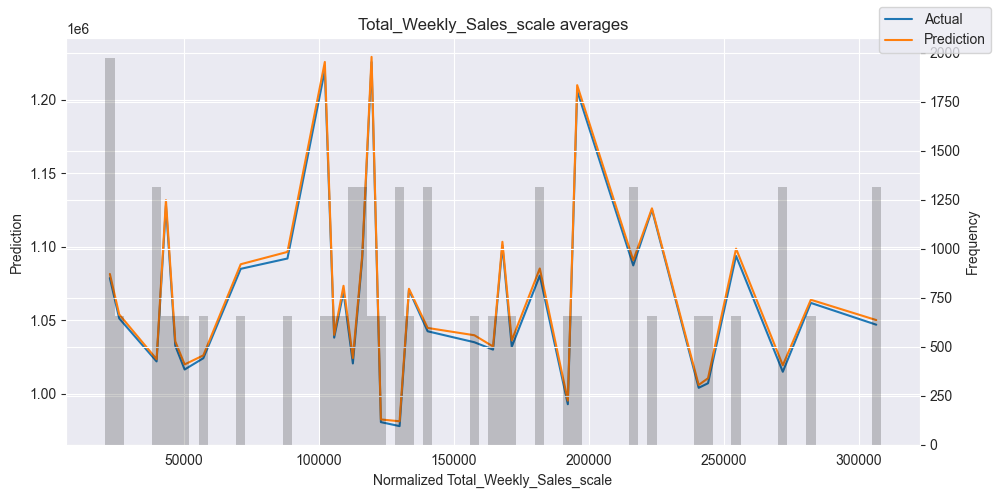

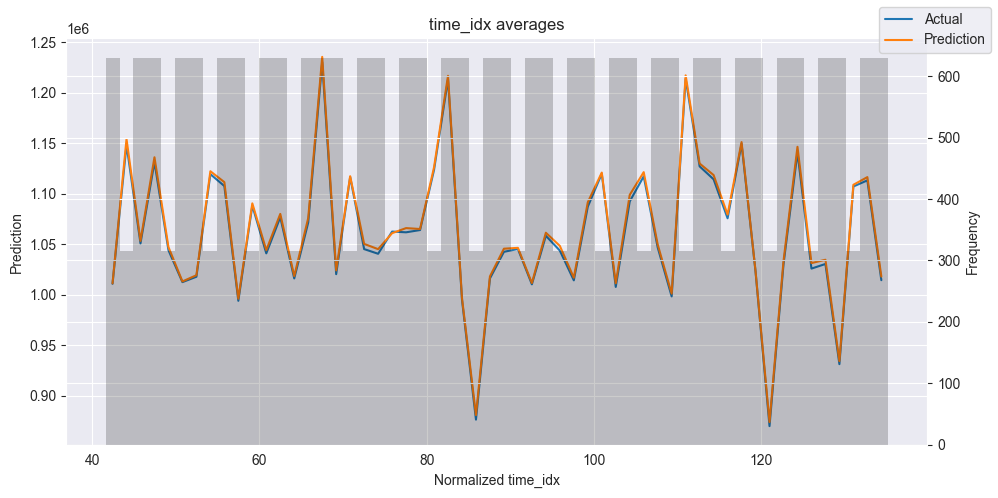

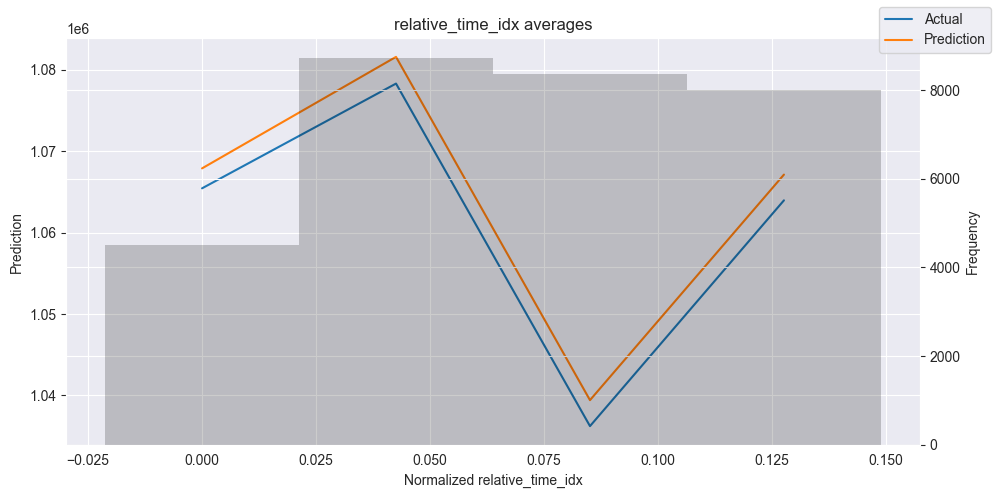

...

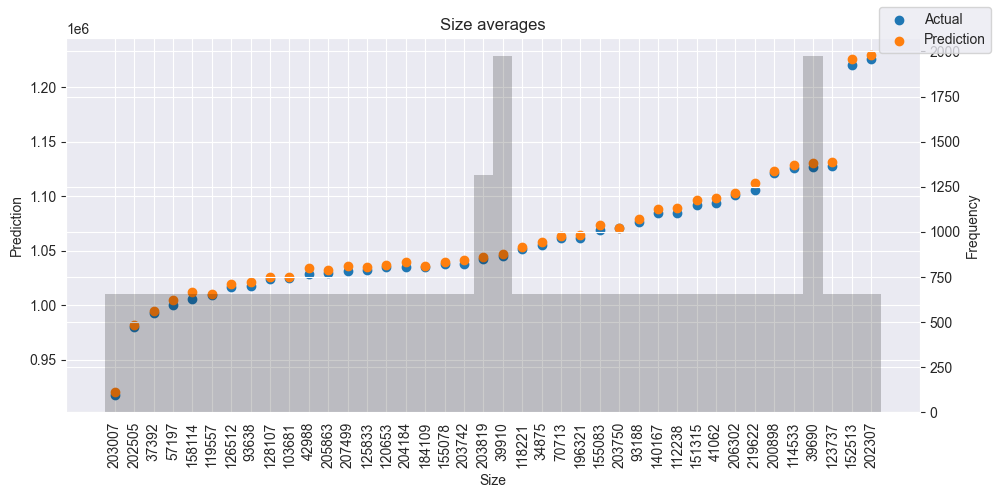

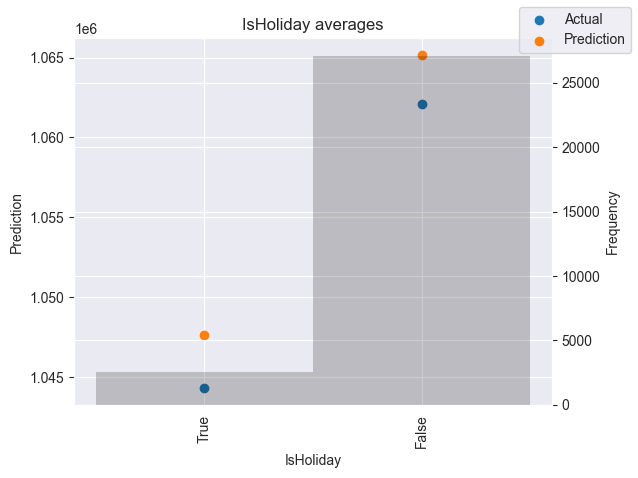

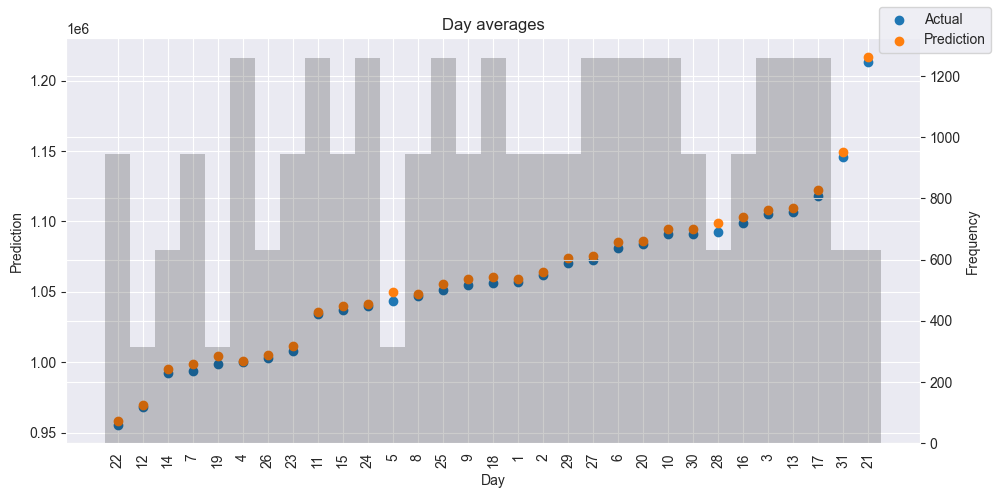

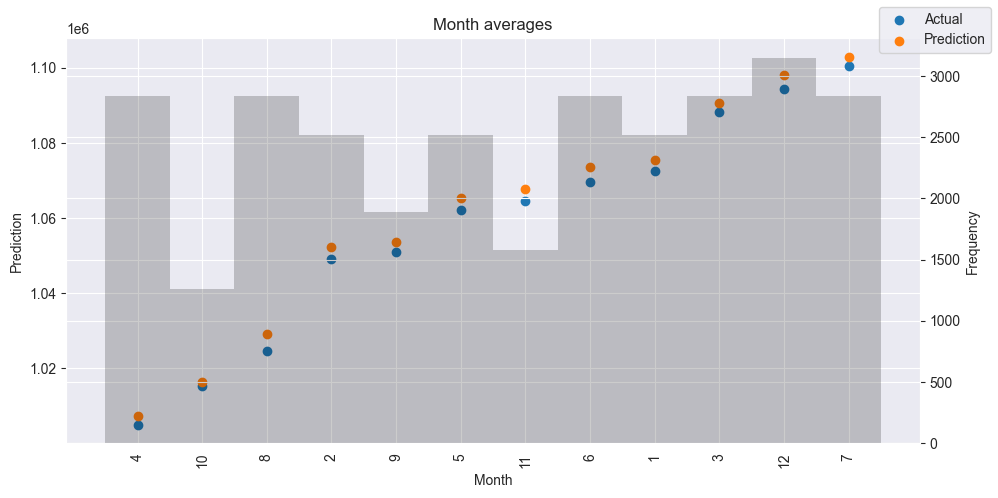

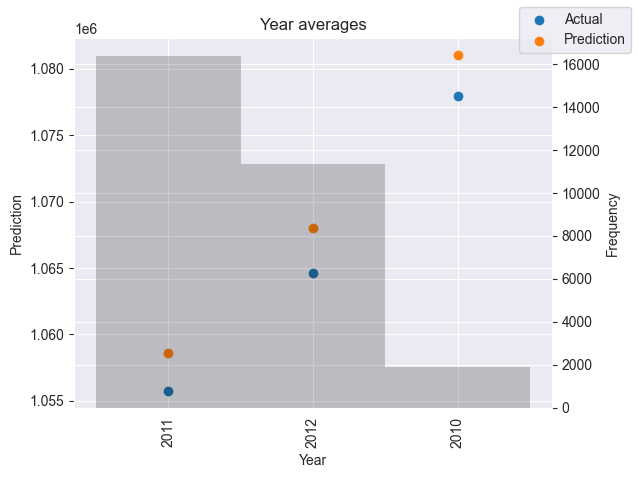

In [57]:
#Analysis on the training set
predictions, x, index, decoder_len, y = best_tft.predict(train_dataloader, return_x=True)
predictions_vs_actuals = best_tft.calculate_prediction_actual_by_variable(x, predictions)
best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals);

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
C:\Users\Weihau.yap\AppData\Local\Programs\Python\Python310\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:430: PossibleUserWarning: The dataloader, predict_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\Weihau.yap\AppData\Local\Programs\Python\Python310\lib\site-packages\pytorch_forecasting\models\base_model.py:1888: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  log_scale = scipy.stats.skew(values_actual) > 1.6
C:\Users\Weihau.yap\AppData\Local\Programs\Python\Python310\lib\site-packages\pytorch_forecasting\models\base_model.py:1888: RuntimeWarning: Precision loss occurred in moment calcu

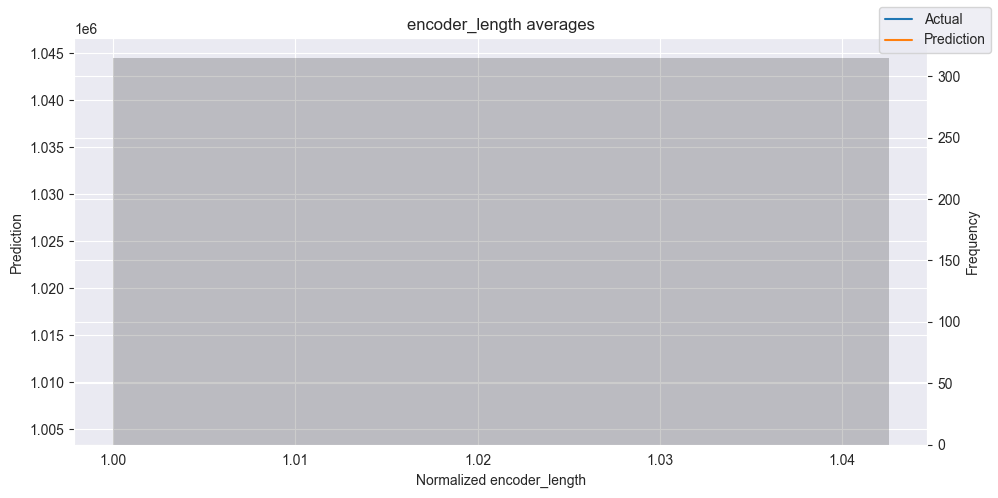

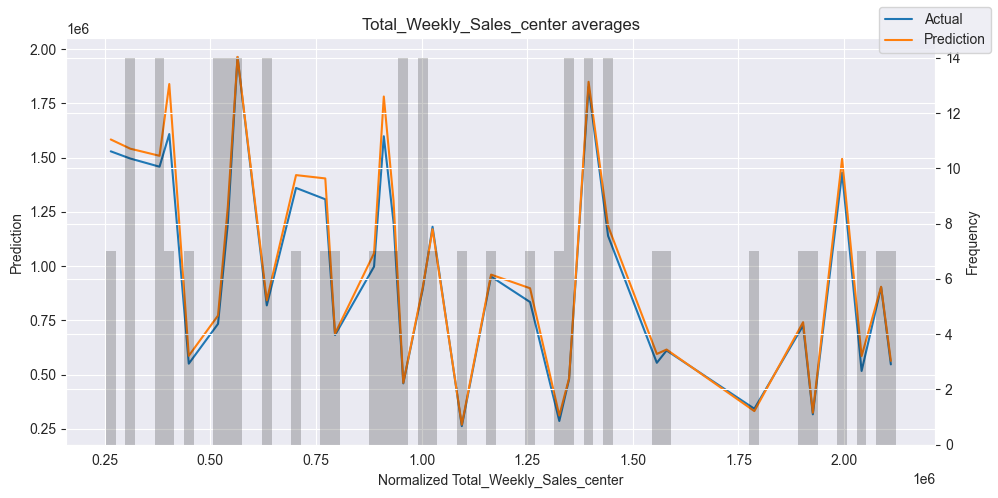

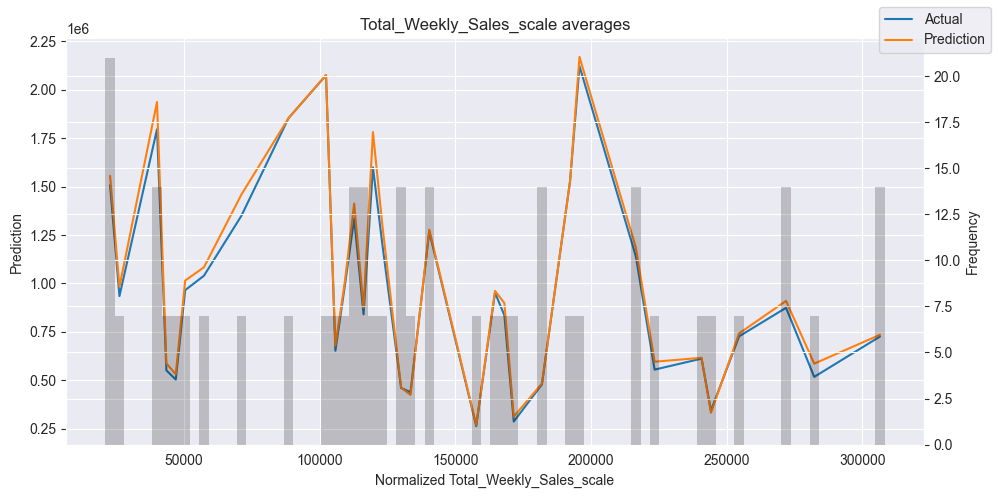

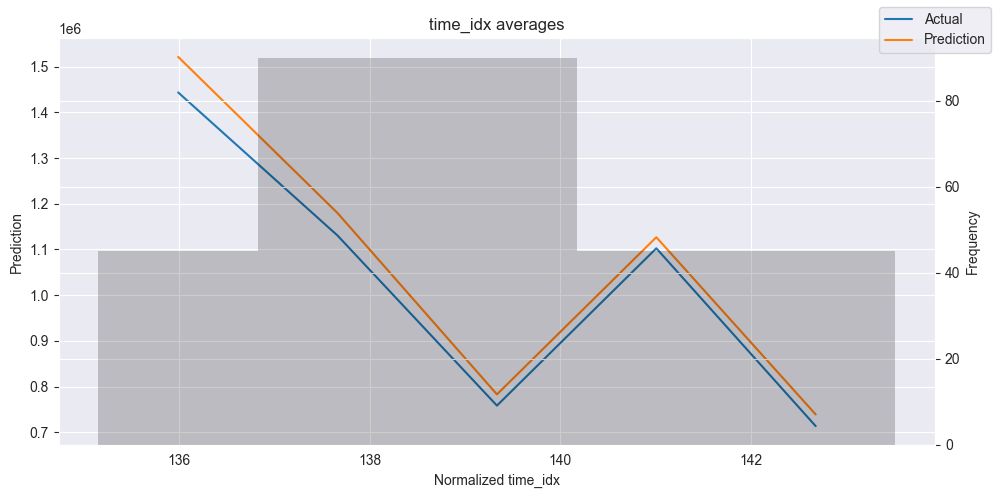

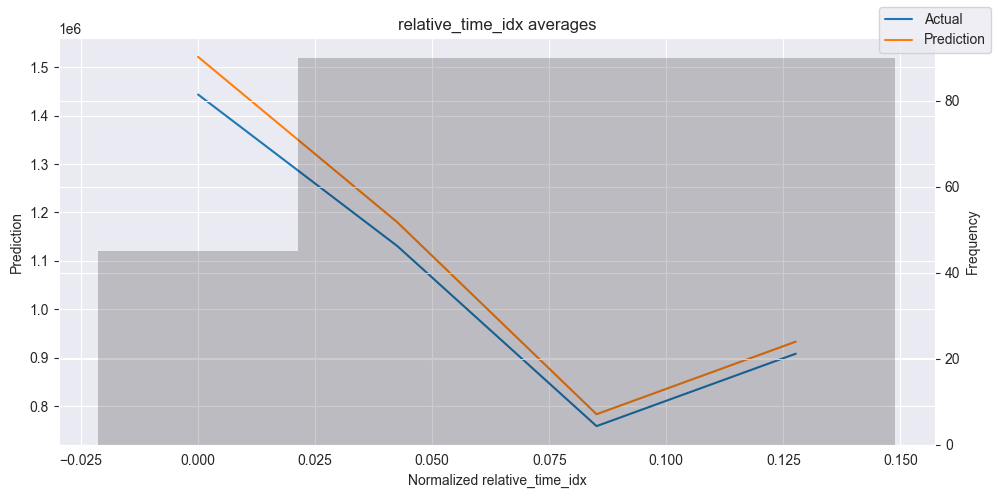

...

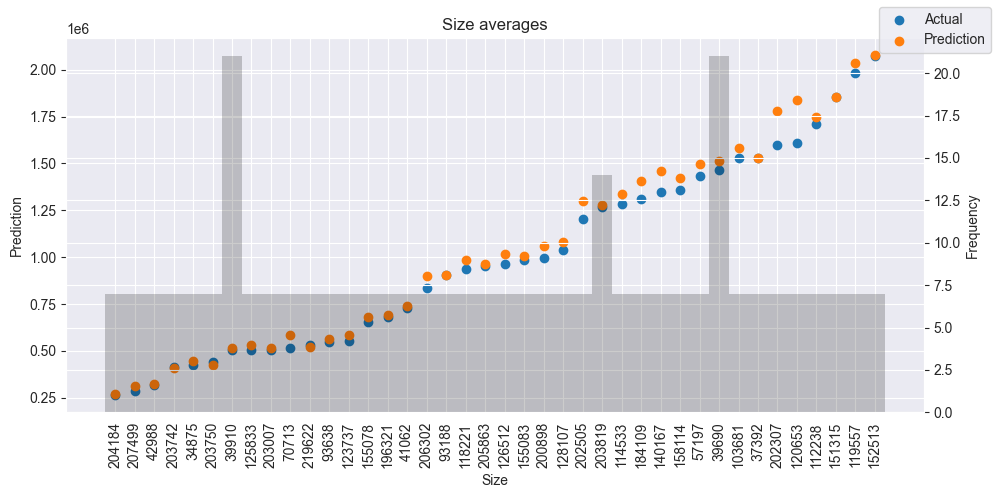

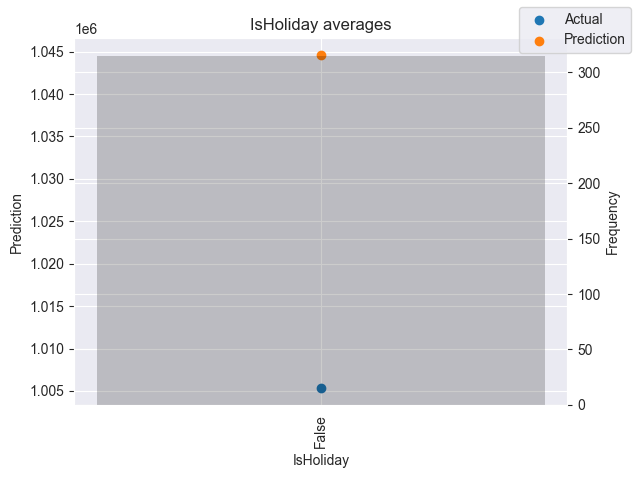

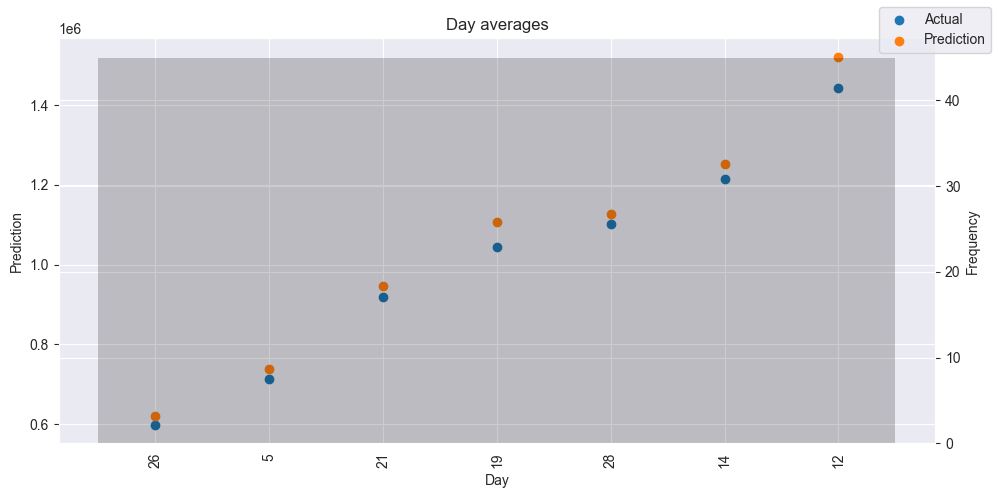

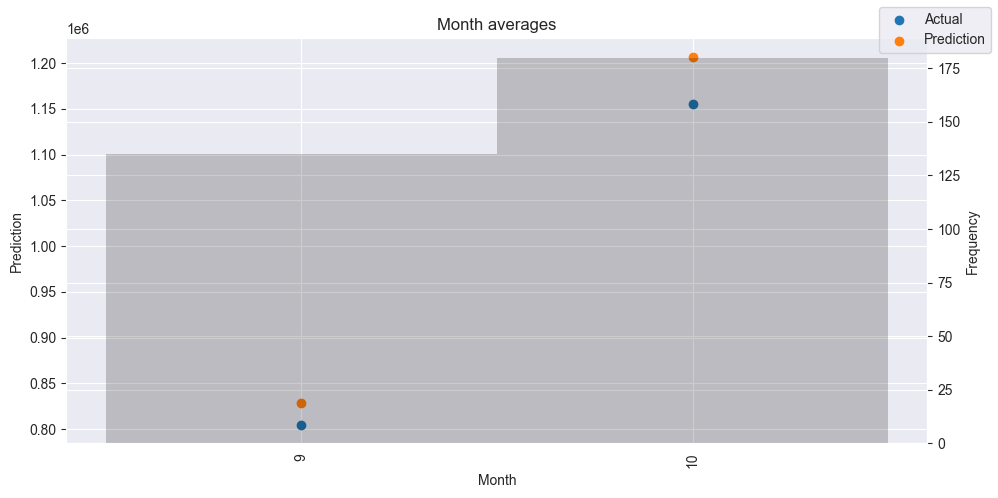

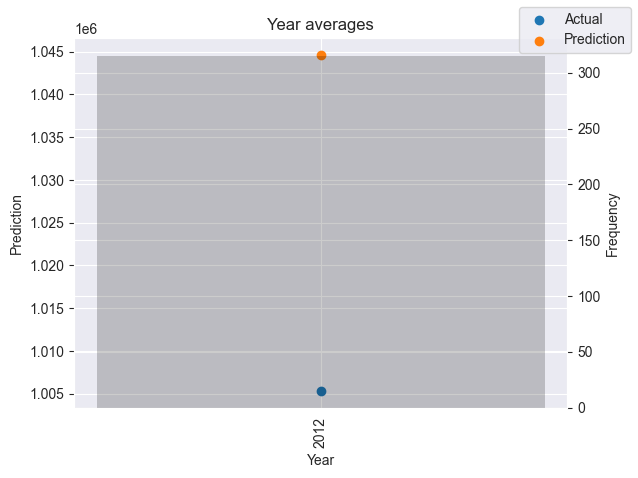

In [58]:
predictions, x, index, decoder_len, y = best_tft.predict(val_dataloader, return_x=True)
predictions_vs_actuals = best_tft.calculate_prediction_actual_by_variable(x, predictions)
best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals);